# **Coding Assignment**

importing important required Libraries

In [16]:
import json
import random
import heapq as h
import copy


#### Loading Graph function


In [17]:
def loading_graph(file='graph_with_metadata.json'):
    with open(file) as f:
        data=json.load(f)

    adj_raw=data['adjacency']
    adj={}
    for k,v in adj_raw.items():
        k=int(k)
        v=[(int(n), w) for n, w in v]
        adj[k]=v
    positions={}
    for k,v in data['positions'].items():
        k=int(k)
        v=tuple(v)
        positions[k]=v
    metadata=data['metadata']
    end_load=metadata['exit_nodes']
    exit_nodes = end_load[1:] if len(end_load) > 1 else end_load
    print(f"Graph successfully loaded from '{file}'")
    print(f"Total nodes: {len(adj)}")
    print(f"Exit nodes: {exit_nodes}")
    return adj, positions,metadata,exit_nodes


#### Dijkstra's Algorithm Implementation

In [18]:
def dijkstra(adj_dict,start,targets):

    distance={}
    for k in adj_dict.keys():
        distance[k]=float('inf')
    distance[start]=0
    previous={}
    for k in adj_dict.keys():
        previous[k]=None
    visited=set()
    pq=[(0,start)]
    while pq:
        curr_dist,curr_node=h.heappop(pq)

        if curr_node in visited:
            continue
        visited.add(curr_node)
        if curr_node in targets:
            path=[]
            node=curr_node
            while node is not None:
                path.append(node)
                node=previous[node]
            path.reverse()
            return  distance[curr_node], path
        if curr_node in adj_dict:
            for neigh,weigh in adj_dict[curr_node]:
                new_dist=curr_dist+weigh
                if new_dist<distance[neigh]:
                    distance[neigh]=new_dist
                    previous[neigh]=curr_node
                    h.heappush(pq,(new_dist,neigh))

    return float('inf'), []



#### Dynamic Event Implementation
The Function gen_rand_event function is used to generate random event, apply_event is used to implement it and revert_event brings back the things to original

In [19]:
def gen_rand_event(adj,prob=0.3):
    if random.random()>prob:
        return None
    event_types=['traffic', 'blockage', 'oneway']
    event_type=random.choice(event_types)

    avail_node=[node for node in adj if len(adj[node])>0]
    if not avail_node:
        return None
    from_node=random.choice(avail_node)
    if not adj[from_node]:
        return None
    to_node, weight = random.choice(adj[from_node])
    if event_type == 'traffic':
        return {
            'type': 'traffic',
            'edge': (from_node, to_node),
            'multiplier': random.uniform(2.0, 2.5),
            'steps_remaining': 3,
            'original_weight': weight
        }
    elif event_type == 'blockage':
        return {
            'type': 'blockage',
            'edge': (from_node, to_node),
            'steps_remaining': 4,
            'original_edge': (to_node, weight)
        }
    else:
        reverse_exists = any(n == from_node for n, w in adj.get(to_node, []))
        if reverse_exists:
            return {
                'type': 'oneway',
                'edge': (to_node, from_node),
                'steps_remaining': 6,
                'removed_edges': []
            }
        return None

def apply_event(event,adj):
    if event['type'] == 'traffic':
        from_node, to_node = event['edge']
        if from_node in adj:
            for i, (neigh, weight) in enumerate(adj[from_node]):
                if neigh == to_node:
                    new_weight = event['original_weight'] * event['multiplier']
                    adj[from_node][i] = (neigh, new_weight)
                    break
    elif event['type'] == 'blockage':
        from_node, to_node = event['edge']
        if from_node in adj:
            adj[from_node] = [(n, w) for n, w in adj[from_node] if n != to_node]
    elif event['type'] == 'oneway':
        from_node, to_node = event['edge']
        if from_node in adj:
            removed = [(n, w) for n, w in adj[from_node] if n == to_node]
            event['removed_edges'] = removed
            adj[from_node] = [(n, w) for n, w in adj[from_node] if n != to_node]

def revert_event(event, adj):
    if event['type'] == 'traffic':
        from_node, to_node = event['edge']
        if from_node in adj:
            for i, (neigh, weight) in enumerate(adj[from_node]):
                if neigh == to_node:
                    adj[from_node][i] = (neigh, event['original_weight'])
                    break

    elif event['type'] == 'blockage':
        from_node, to_node = event['edge']
        to_node_data, weight = event['original_edge']
        if from_node in adj:
            adj[from_node].append((to_node_data, weight))

    elif event['type'] == 'oneway':
        from_node, to_node = event['edge']
        if from_node in adj and event['removed_edges']:
            adj[from_node].extend(event['removed_edges'])




#### Movement

In [20]:
def move(car, adj, speed, target=None):
    if not car.get('path') or len(car['path']) == 0:
        return True, False
    if car.get('edge_from') is None:
        current_pos = car['pos']
        if target and current_pos in target:
            return False, True
        if len(car['path']) > 1:
            next_node = car['path'][1]
            edge_weight = None
            if current_pos in adj:
                for neighbor, weight in adj[current_pos]:
                    if neighbor == next_node:
                        edge_weight = weight
                        break
            if edge_weight is None:
                return True, False
            car['edge_from'] = current_pos
            car['edge_to'] = next_node
            car['progress'] = 0
            car['edge_weight'] = edge_weight
        else:
            return False, False
    car['progress'] += speed
    if car['progress'] >= car['edge_weight']:
        car['pos'] = car['edge_to']
        car['edge_from'] = None
        car['edge_to'] = None
        car['progress'] = 0
        if car['path'] and len(car['path']) > 0 and car['path'][0] != car['pos']:
            while car['path'] and car['path'][0] != car['pos']:
                car['path'].pop(0)
        if target and car['pos'] in target:
            return False, True

        return False, False
    return False, False


def check_catch(carA, carB):
    if carA['pos'] == carB['pos'] and carA.get('edge_from') is None and carB.get('edge_from') is None:
        return True
    if (carA.get('edge_from') is not None and carB.get('edge_from') is not None):
        if (carA['edge_from'] == carB['edge_from'] and carA['edge_to'] == carB['edge_to']):
            distance = abs(carA['progress'] - carB['progress'])
            if distance < 0.5:
                return True

    return False


#### function for Final simulation

In [21]:
def run_simulation(adj, exit_nodes, max_steps=50):

    original_adj = copy.deepcopy(adj)
    carA = {
        'pos': 0,
        'speed': 1.0,
        'path': [],
        'edge_from': None,
        'edge_to': None,
        'progress': 0,
        'edge_weight': 0
    }

    carB = {
        'pos': 49,
        'speed': 1.5,
        'path': [],
        'edge_from': None,
        'edge_to': None,
        'progress': 0,
        'delay': 3,
        'edge_weight': 0
    }
    dist, path = dijkstra(adj, carA['pos'], exit_nodes)
    carA['path'] = path

    history = []
    active_events = []
    caught = False
    reached = False

    print("=== Simulation Start ===")
    print(f"Car A starting at node {carA['pos']}, targeting exits: {exit_nodes}")
    print(f"Car B starting at node {carB['pos']}, will start after {carB['delay']} steps")
    print(f"A's initial path {carA['path']}\n")

    for step in range(1, max_steps + 1):
        print(f"\nstep {step}")
        new_event = gen_rand_event(adj, prob=0.3)
        if new_event:
            new_event['just_added'] = True
            apply_event(new_event, adj)
            active_events.append(new_event)
        for event in active_events:
            if event.get('just_added', False):
                if event['type'] == 'traffic':
                    orig_w = event['original_weight']
                    new_w = orig_w * event['multiplier']
                    print(f"Event: new traffic from {event['edge'][0]} to {event['edge'][1]}, weight {orig_w:.2f} -> {new_w:.2f}")
                elif event['type'] == 'blockage':
                    print(f"Event: new blockage from {event['edge'][0]} to {event['edge'][1]}")
                elif event['type'] == 'oneway':
                    print(f"Event: new oneway restriction from {event['edge'][0]} to {event['edge'][1]}")
                event['just_added'] = False
        events_to_remove = []
        for event in active_events:
            event['steps_remaining'] -= 1
            if event['steps_remaining'] <= 0:
                revert_event(event, adj)
                events_to_remove.append(event)

        for event in events_to_remove:
            print(f"Event: clear {event['type']} from {event['edge'][0]} to {event['edge'][1]}")
            active_events.remove(event)
        if new_event or events_to_remove:
            if carA.get('edge_from') is None and not reached:
                dist, path = dijkstra(adj, carA['pos'], exit_nodes)
                carA['path'] = path

            if step > carB['delay'] and carB.get('edge_from') is None:
                if carA.get('edge_to') is not None:
                    target_node = carA['edge_to']
                else:
                    target_node = carA['pos']
                dist, path = dijkstra(adj, carB['pos'], [target_node])
                carB['path'] = path
        if carA.get('edge_from') is not None:
            edge_weight = carA['edge_weight']
            progress = carA['progress']
            print(f"A going from {carA['edge_from']} to {carA['edge_to']}, progress is {progress:.2f}/{edge_weight:.2f}")
        else:
            if carA['path'] and len(carA['path']) > 1:
                next_node = carA['path'][1]
                edge_weight = None
                if carA['pos'] in adj:
                    for neighbor, weight in adj[carA['pos']]:
                        if neighbor == next_node:
                            edge_weight = weight
                            break
                if edge_weight:
                    print(f"A is at {carA['pos']} and moving to {next_node}, weight is {edge_weight:.2f}")
            else:
                print(f"A is at {carA['pos']}")
        if not reached:
            prev_pos_A = carA['pos']
            prev_edge_A = carA.get('edge_from')

            need_replan, carA_reached = move(carA, adj, carA['speed'], exit_nodes)

            if carA_reached:
                reached = True
                print(f"A arrived at {carA['pos']} - EXIT REACHED!")
            elif prev_pos_A != carA['pos'] or (prev_edge_A is not None and carA.get('edge_from') is None):
                if carA.get('edge_from') is None and prev_edge_A is not None:
                    print(f"A arrived at {carA['pos']}")
        if step > carB['delay']:
            if carA.get('edge_to') is not None:
                target_node = carA['edge_to']
            else:
                target_node = carA['pos']
            if carB.get('edge_from') is None:
                dist, path = dijkstra(adj, carB['pos'], [target_node])
                carB['path'] = path
            if carB.get('edge_from') is not None:
                edge_weight = carB['edge_weight']
                progress = carB['progress']
                print(f"B going from {carB['edge_from']} to {carB['edge_to']}, progress is {progress:.2f}/{edge_weight:.2f}")
            else:
                if carB['path'] and len(carB['path']) > 0:
                    print(f"B is at {carB['pos']} and chasing path to A is {carB['path']}")

                    if len(carB['path']) > 1:
                        next_node = carB['path'][1]
                        edge_weight = None
                        if carB['pos'] in adj:
                            for neighbor, weight in adj[carB['pos']]:
                                if neighbor == next_node:
                                    edge_weight = weight
                                    break
                        if edge_weight:
                            print(f"B is moving to {next_node}, weight is {edge_weight:.2f}")
            prev_pos_B = carB['pos']
            prev_edge_B = carB.get('edge_from')

            needsReplan, _ = move(carB, adj, carB['speed'])
            if prev_pos_B != carB['pos'] or (prev_edge_B is not None and carB.get('edge_from') is None):
                if carB.get('edge_from') is None and prev_edge_B is not None:
                    print(f"B arrived at {carB['pos']}")

        if step > carB['delay'] and not reached:
            caught = check_catch(carA, carB)
            if caught:
                if carA.get('edge_from') is None:
                    print(f"\n*** Car B caught Car A at node {carA['pos']}! ***")
                else:
                    print(f"\n*** Car B caught Car A on edge ({carA['edge_from']}, {carA['edge_to']})! ***")

        log_events = [
            {
                'type': e['type'],
                'edge': e['edge'],
                'steps_remaining': e['steps_remaining']
            }
            for e in active_events
        ]

        history.append({
            "step": step,
            "carA": {
                "pos": carA['pos'],
                "edge_from": carA.get('edge_from'),
                "edge_to": carA.get('edge_to'),
                "progress": round(carA.get('progress', 0), 2),
                "Dijkstra_path": list(carA.get('path', []))
            },
            "carB": {
                "pos": carB['pos'],
                "edge_from": carB.get('edge_from'),
                "edge_to": carB.get('edge_to'),
                "progress": round(carB.get('progress', 0), 2),
                "Dijkstra_path": list(carB.get('path', []))
            },
            "caught": caught,
            "reached": reached,
            "log_events": log_events
        })
        if caught or reached:
            break

    return history, caught, reached


In [22]:
def save_simulation_log(history, filename="simulation_log.json"):
    with open(filename, "w") as f:
        json.dump(history, f, indent=2)
    print(f"Simulation log saved to '{filename}'")

#### **Output**

In [23]:
adjacency, positions, metadata, exit_nodes = loading_graph("graph_with_metadata.json")
history, caught, reached = run_simulation(adjacency, exit_nodes, max_steps=50)
save_simulation_log(history, "simulation_log.json")
print("\n=== Simulation Complete ===")
if caught:
    print("Car B caught Car A! Paris Police!! Saviour of the Louvre!!!")
elif reached:
    last_pos = history[-1]['carA']['pos']
    print(f"Car A reached exit {last_pos} first! The burglars vanish like thin air...")
else:
    print("Simulation ended without conclusion (max steps reached)")

Graph successfully loaded from 'graph_with_metadata.json'
Total nodes: 50
Exit nodes: [48]
=== Simulation Start ===
Car A starting at node 0, targeting exits: [48]
Car B starting at node 49, will start after 3 steps
A's initial path [0, 1, 40, 38, 48]


step 1
A is at 0 and moving to 1, weight is 3.62

step 2
A going from 0 to 1, progress is 1.00/3.62

step 3
Event: new blockage from 34 to 38
A going from 0 to 1, progress is 2.00/3.62

step 4
A going from 0 to 1, progress is 3.00/3.62
A arrived at 1
B is at 49 and chasing path to A is [49, 8, 1]
B is moving to 8, weight is 6.27

step 5
Event: new traffic from 34 to 3, weight 5.05 -> 10.18
A is at 1 and moving to 40, weight is 2.42
B going from 49 to 8, progress is 1.50/6.27

step 6
Event: new oneway restriction from 47 to 38
Event: clear blockage from 34 to 38
A going from 1 to 40, progress is 1.00/2.42
B going from 49 to 8, progress is 3.00/6.27

step 7
Event: clear traffic from 34 to 3
A going from 1 to 40, progress is 2.00/2.42
A ar

#### Summary

In [24]:
def analyze_simulation(history):
    total_steps = len(history)

    traffic_events = 0
    blockage_events = 0
    oneway_events = 0

    for record in history:
        for event in record['log_events']:
            if event['type'] == 'traffic':
                traffic_events += 1
            elif event['type'] == 'blockage':
                blockage_events += 1
            elif event['type'] == 'oneway':
                oneway_events += 1

    print("=== Simulation Statistics ===")
    print(f"Total steps: {total_steps}")
    print(f"Traffic jam events: {traffic_events}")
    print(f"Blockage events: {blockage_events}")
    print(f"One-way events: {oneway_events}")

    replan_count_A = 0
    replan_count_B = 0
    prev_path_A = []
    prev_path_B = []

    for record in history:
        curr_path_A = record['carA']['Dijkstra_path']
        curr_path_B = record['carB']['Dijkstra_path']

        if prev_path_A and curr_path_A != prev_path_A and len(curr_path_A) > 0:
            replan_count_A += 1
        if prev_path_B and curr_path_B != prev_path_B and len(curr_path_B) > 0:
            replan_count_B += 1

        prev_path_A = curr_path_A
        prev_path_B = curr_path_B

    print(f"Car A path replanning count: {replan_count_A}")
    print(f"Car B path replanning count: {replan_count_B}")
analyze_simulation(history)

=== Simulation Statistics ===
Total steps: 13
Traffic jam events: 2
Blockage events: 3
One-way events: 14
Car A path replanning count: 4
Car B path replanning count: 4


## Visualization

In [25]:
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


In [26]:
def create_networkx_graph(adj, positions):
    G = nx.DiGraph()
    for node in positions.keys():
        G.add_node(node, pos=positions[node])

    for from_node, neighbors in adj.items():
        for to_node, weight in neighbors:
            G.add_edge(from_node, to_node, weight=weight)

    return G

In [27]:
def visualize_static(adj, positions, exit_nodes, carA_pos=0, carB_pos=49,
                     active_events=None, carA_path=None, carB_path=None):
    G = create_networkx_graph(adj, positions)

    fig, ax = plt.subplots(figsize=(14, 10))
    from matplotlib.lines import Line2D
    from matplotlib.patches import Patch
    legend_elements = []
    nx.draw_networkx_edges(G, positions, edge_color='lightgray',
                          arrows=True, arrowsize=10, width=1.5, alpha=0.6)
    if carA_path and len(carA_path) > 1:
        path_edges = [(carA_path[i], carA_path[i+1]) for i in range(len(carA_path)-1)]
        nx.draw_networkx_edges(G, positions, edgelist=path_edges,
                              edge_color='red', width=2.5, alpha=0.7,
                              arrows=True, arrowsize=15, style='dashed')
        legend_elements.append(Line2D([0], [0], color='red', linewidth=2.5,
                             linestyle='--', label='Car A Path'))

    if carB_path and len(carB_path) > 1:
        path_edges = [(carB_path[i], carB_path[i+1]) for i in range(len(carB_path)-1)]
        nx.draw_networkx_edges(G, positions, edgelist=path_edges,
                              edge_color='blue', width=2.5, alpha=0.7,
                              arrows=True, arrowsize=15, style='dotted')
        legend_elements.append(Line2D([0], [0], color='blue', linewidth=2.5,
                             linestyle=':', label='Car B Path'))

    if active_events:
        traffic_edges = []
        blockage_edges = []
        oneway_edges = []

        for event in active_events:
            edge = event['edge']
            if event['type'] == 'traffic':
                traffic_edges.append(edge)
            elif event['type'] == 'blockage':
                blockage_edges.append(edge)
            elif event['type'] == 'oneway':
                oneway_edges.append(edge)
        if traffic_edges:
            nx.draw_networkx_edges(G, positions, edgelist=traffic_edges,
                                  edge_color='orange', width=4, alpha=0.9)
            legend_elements.append(Line2D([0], [0], color='orange', linewidth=4,
                             label='Traffic Jam'))


        if blockage_edges:
            nx.draw_networkx_edges(G, positions, edgelist=blockage_edges,
                                  edge_color='red', width=4, alpha=0.9,
                                  style='solid')
            legend_elements.append(Line2D([0], [0], color='red', linewidth=4,
                             label='Blockage'))


        if oneway_edges:
            nx.draw_networkx_edges(G, positions, edgelist=oneway_edges,
                                  edge_color='purple', width=4, alpha=0.9)
            legend_elements.append(Line2D([0], [0], color='purple', linewidth=4,
                             label='One-way Restriction'))


    regular_nodes = [n for n in G.nodes() if n not in exit_nodes and n != carA_pos and n != carB_pos]
    nx.draw_networkx_nodes(G, positions, nodelist=regular_nodes,
                          node_color='lightblue', node_size=200, alpha=0.8)

    nx.draw_networkx_nodes(G, positions, nodelist=exit_nodes,
                          node_color='green', node_size=400, alpha=0.9,
                          node_shape='s')
    legend_elements.append(Patch(facecolor='green', label='Exit Nodes'))


    nx.draw_networkx_nodes(G, positions, nodelist=[carA_pos],
                          node_color='red', node_size=500, alpha=1.0,
                          node_shape='o')
    legend_elements.append(Line2D([0], [0], marker='o', color='w',
                             markerfacecolor='red', markersize=12,
                             label='Car A (Burglar)'))


    nx.draw_networkx_nodes(G, positions, nodelist=[carB_pos],
                          node_color='blue', node_size=500, alpha=1.0,
                          node_shape='o')
    legend_elements.append(Line2D([0], [0], marker='o', color='w',
                             markerfacecolor='blue', markersize=12,
                             label='Car B (Police)'))


    nx.draw_networkx_labels(G, positions, font_size=8, font_weight='bold')

    ax.set_title("Paris Police Chase - Louvre Heist Simulation",
             fontsize=16, fontweight='bold', pad=20)
    ax.legend(handles=legend_elements, loc='upper right', fontsize=11,
          framealpha=0.9, edgecolor='black')
    ax.axis('off')

    plt.tight_layout()
    plt.show()


#### Initial State Visualization

Graph successfully loaded from 'graph_with_metadata.json'
Total nodes: 50
Exit nodes: [48]


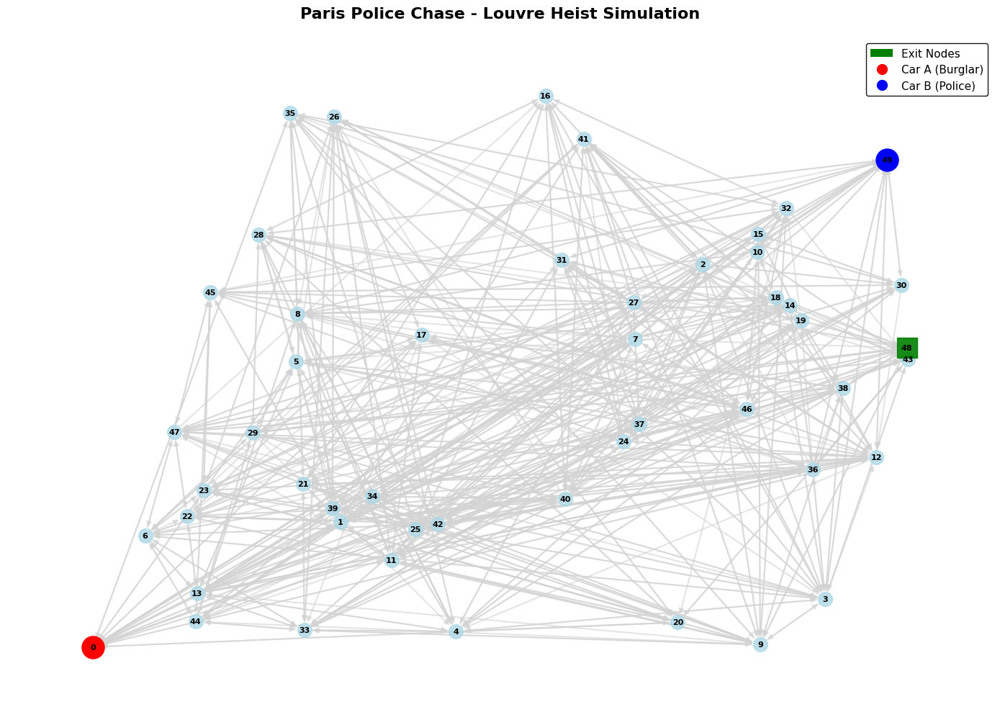

In [28]:
adjacency_viz, positions_viz, _, exit_nodes_viz = loading_graph("graph_with_metadata.json")
visualize_static(adjacency_viz, positions_viz, exit_nodes_viz, carA_pos=0, carB_pos=49)

In [29]:
def visualize_steps(history, adjacency, positions, exit_nodes, steps_to_show=None):
    if steps_to_show is None:
        steps_to_show = [i for i in range(0,len(history))]

    for step_idx in steps_to_show:
        if step_idx >= len(history):
            continue

        step_data = history[step_idx]

        print(f"\n=== Step {step_data['step']} ===")

        carA_data = step_data['carA']
        carB_data = step_data['carB']

        visualize_static(
            adjacency,
            positions,
            exit_nodes,
            carA_pos=carA_data['pos'],
            carB_pos=carB_data['pos'],
            active_events=step_data['log_events'],
            carA_path=carA_data.get('Dijkstra_path', []),
            carB_path=carB_data.get('Dijkstra_path', [])
        )


### Step wise Step Outputs

Graph successfully loaded from 'graph_with_metadata.json'
Total nodes: 50
Exit nodes: [48]

=== Step 1 ===


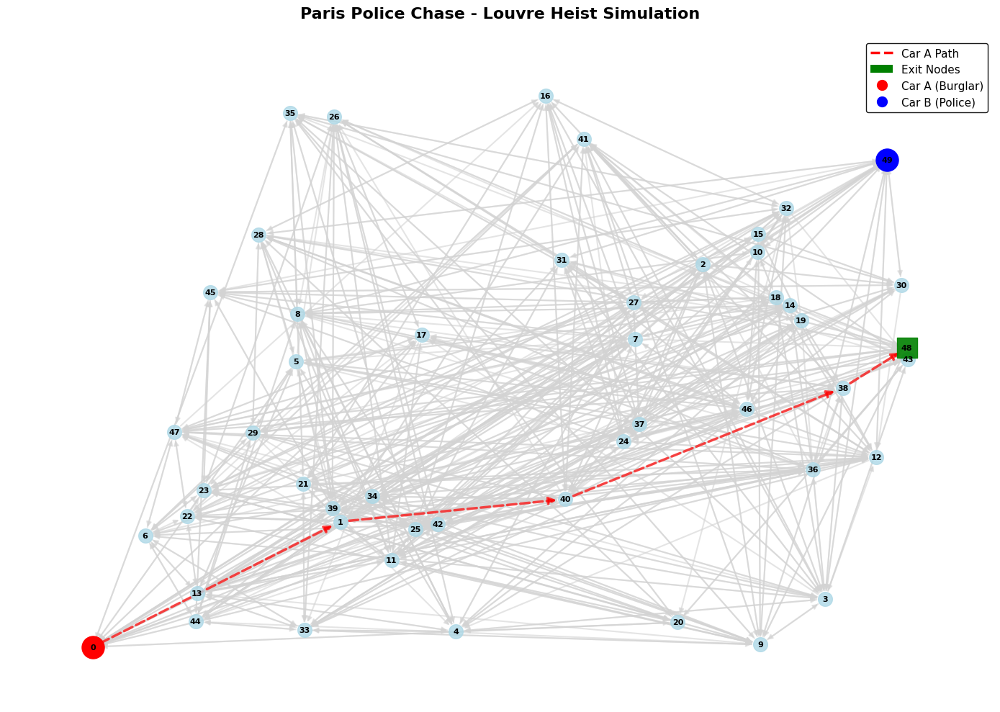


=== Step 2 ===


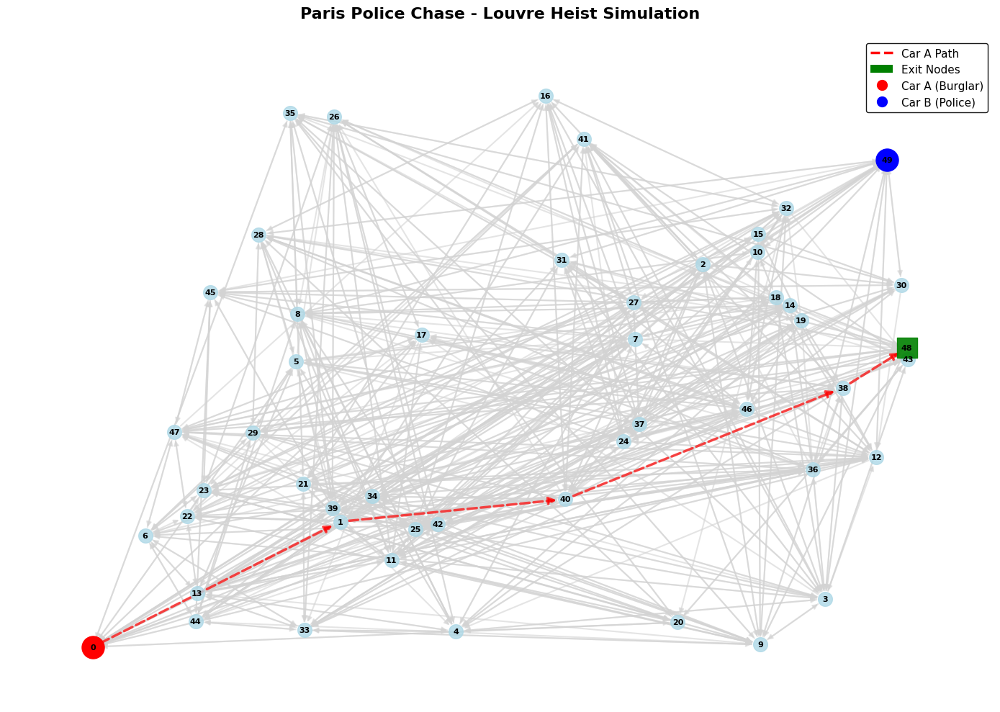


=== Step 3 ===


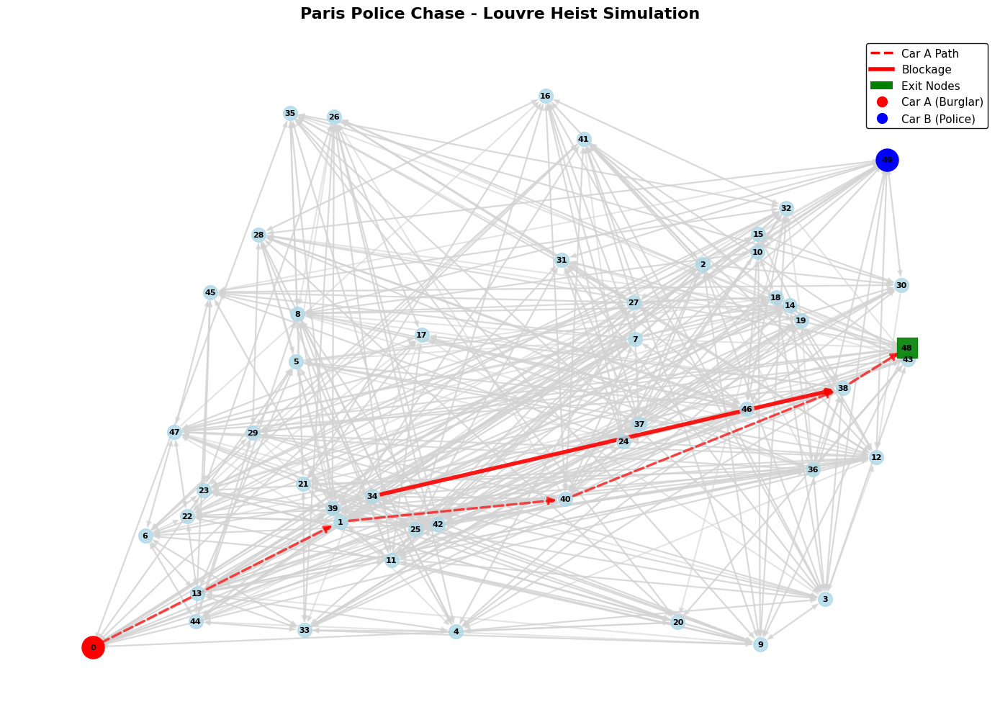


=== Step 4 ===


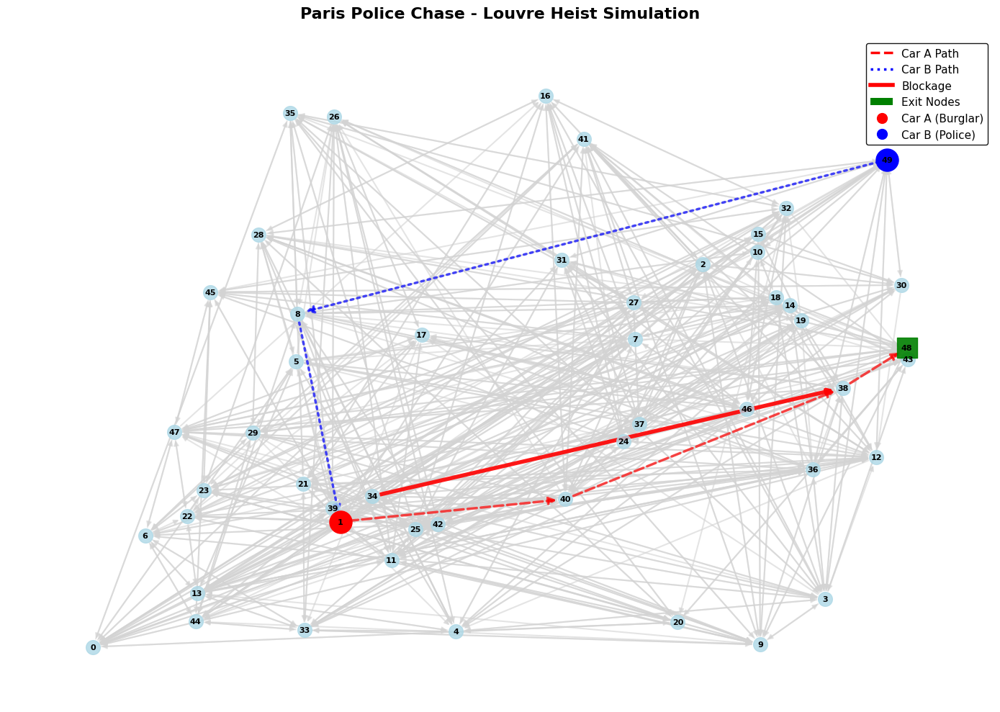


=== Step 5 ===


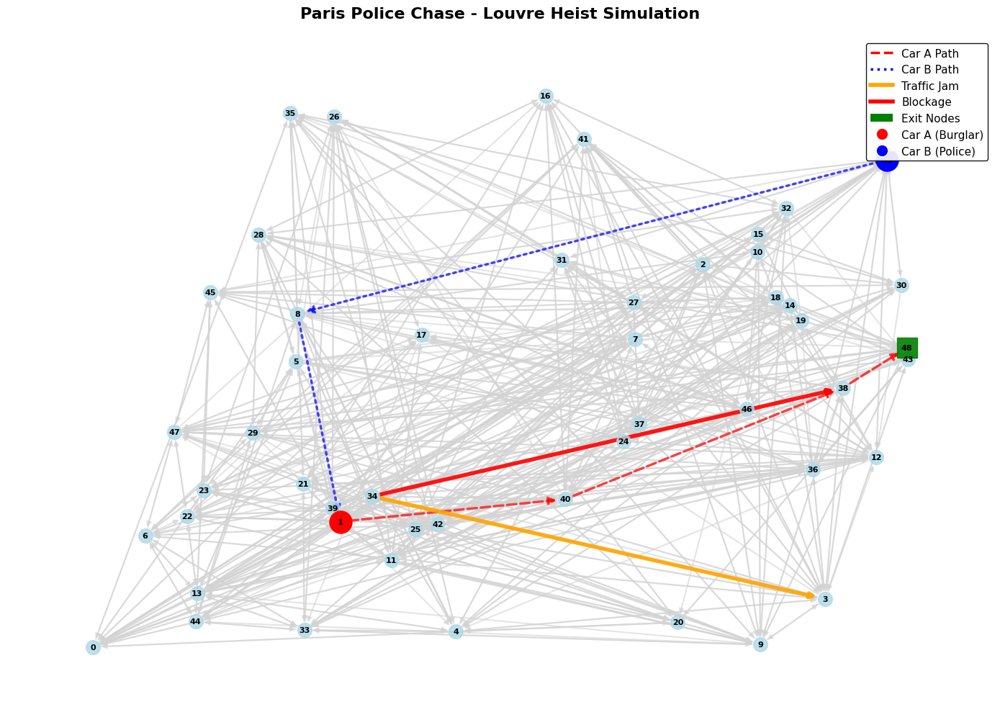


=== Step 6 ===


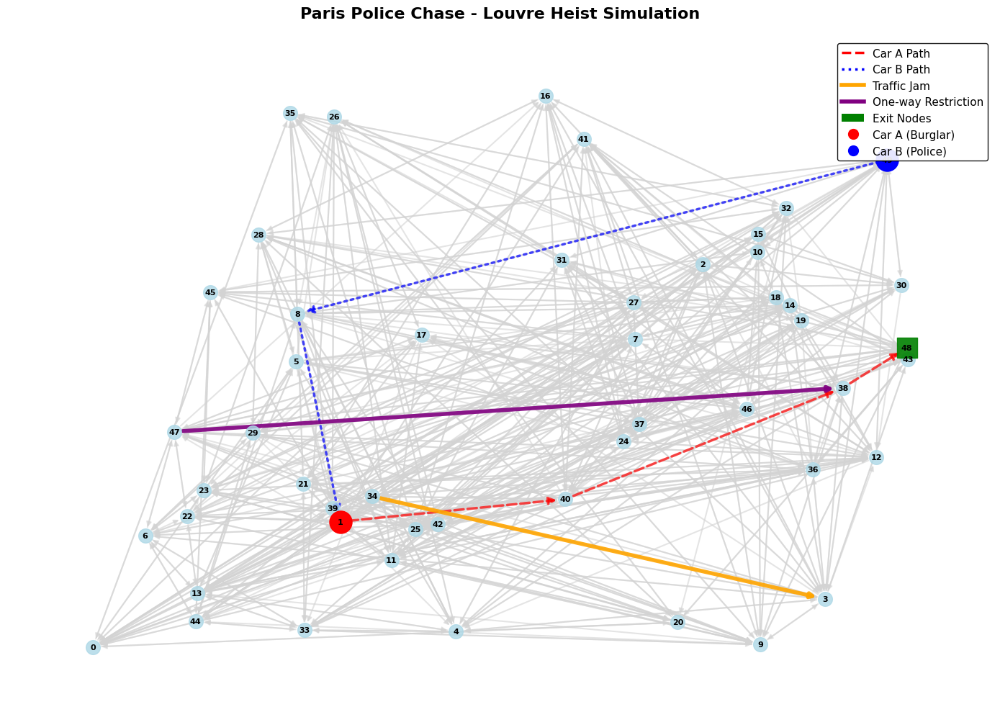


=== Step 7 ===


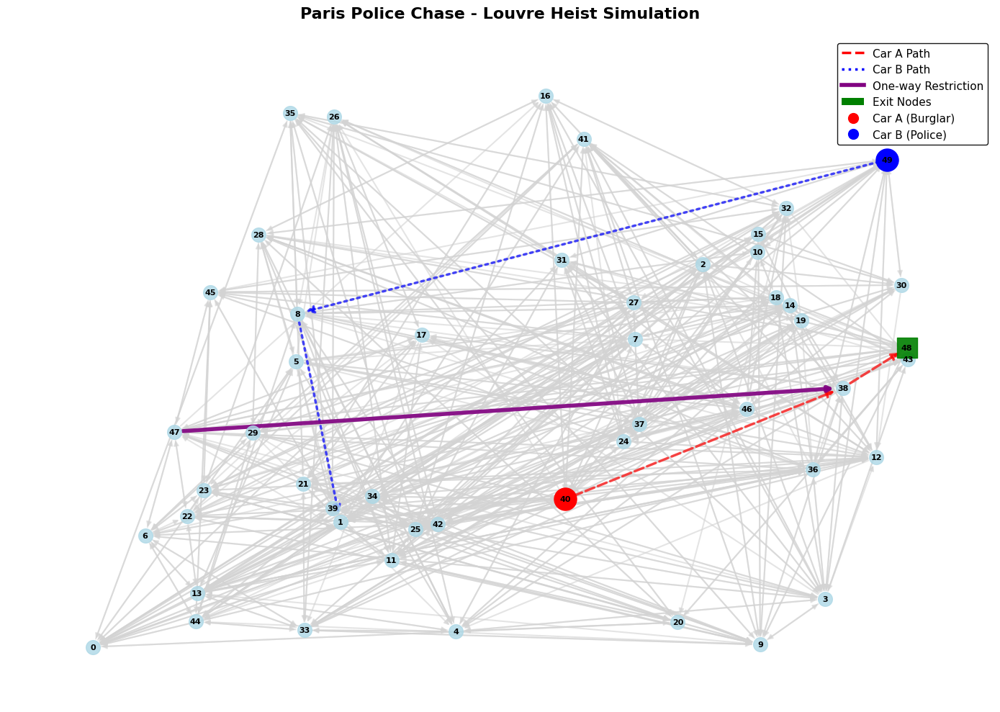


=== Step 8 ===


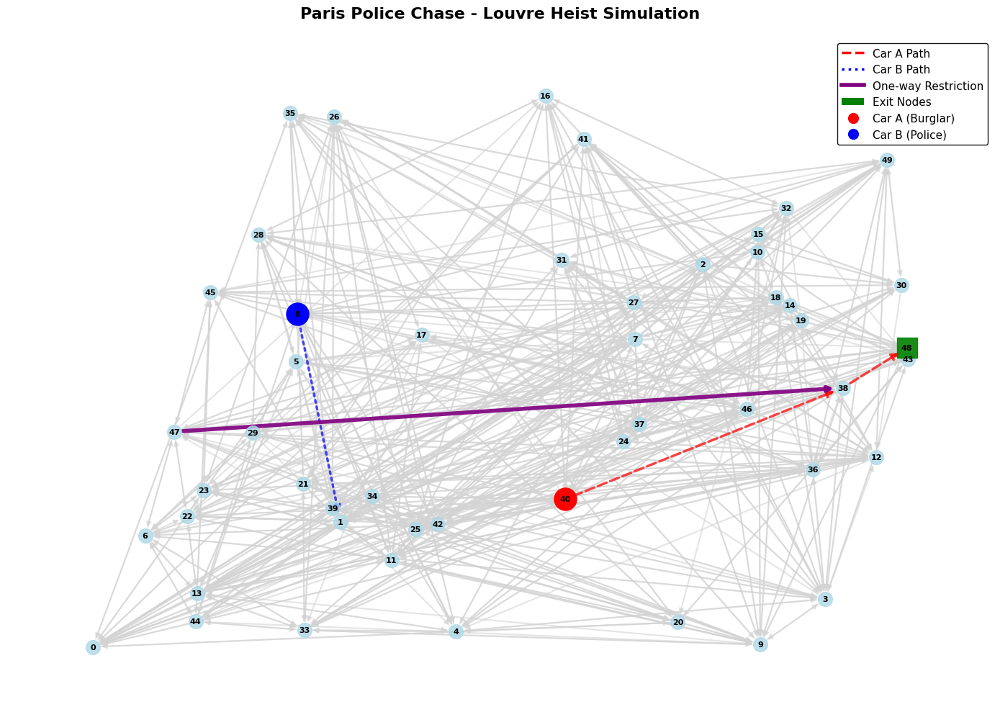


=== Step 9 ===


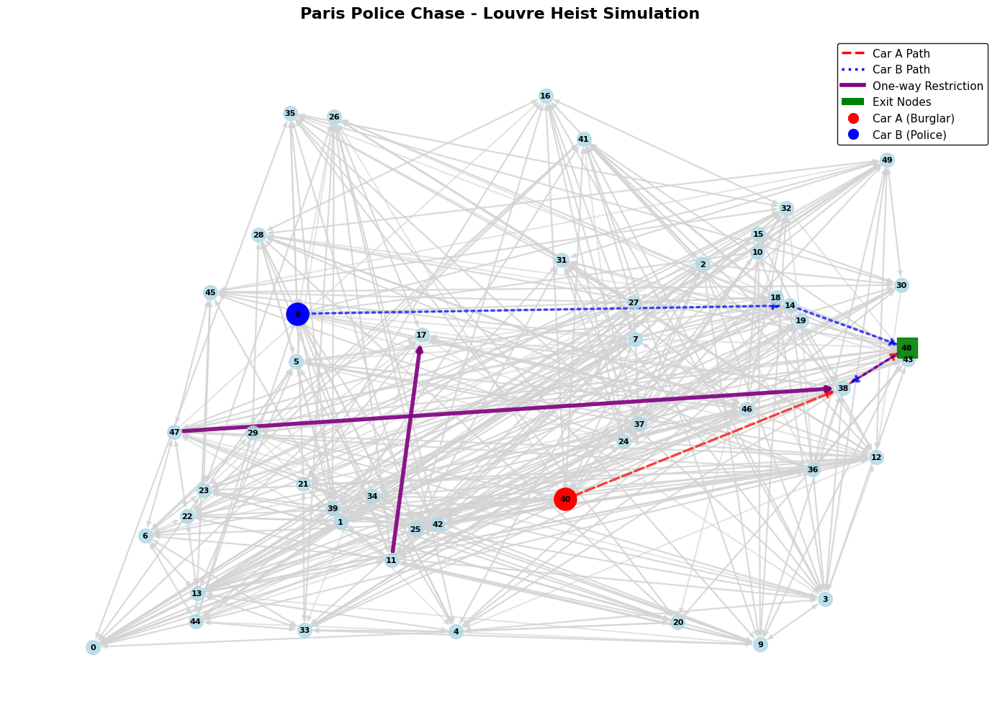


=== Step 10 ===


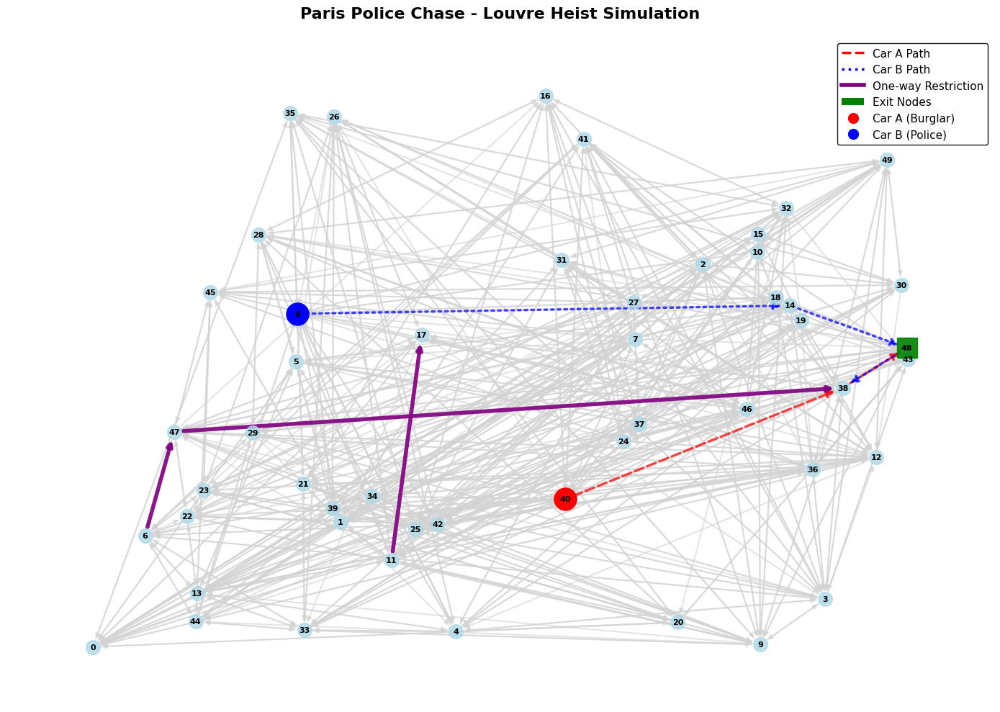


=== Step 11 ===


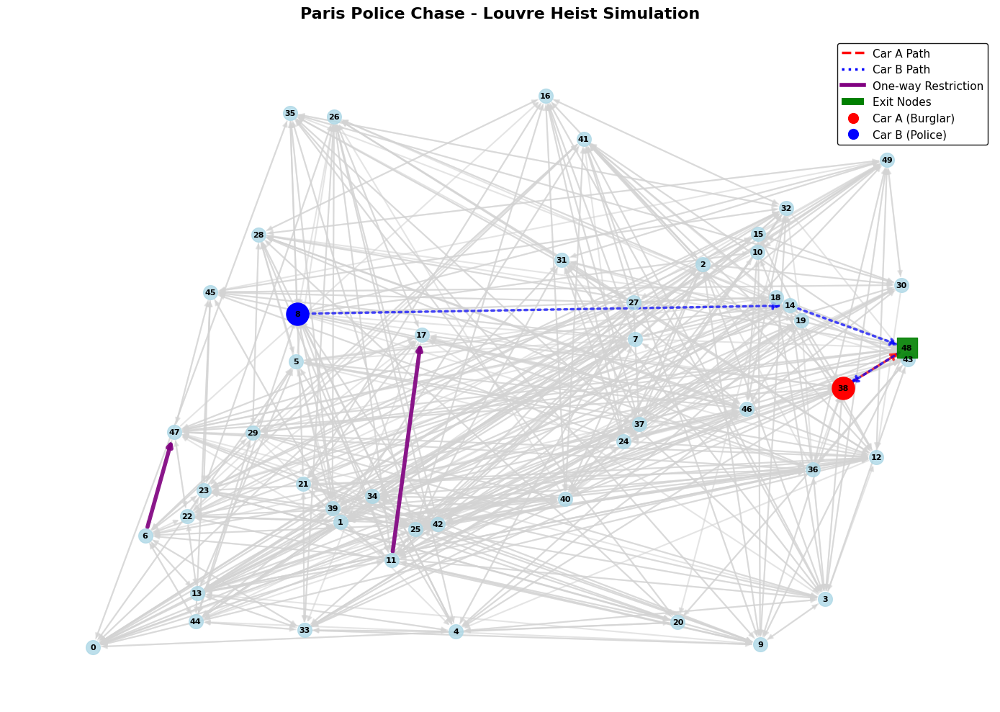


=== Step 12 ===


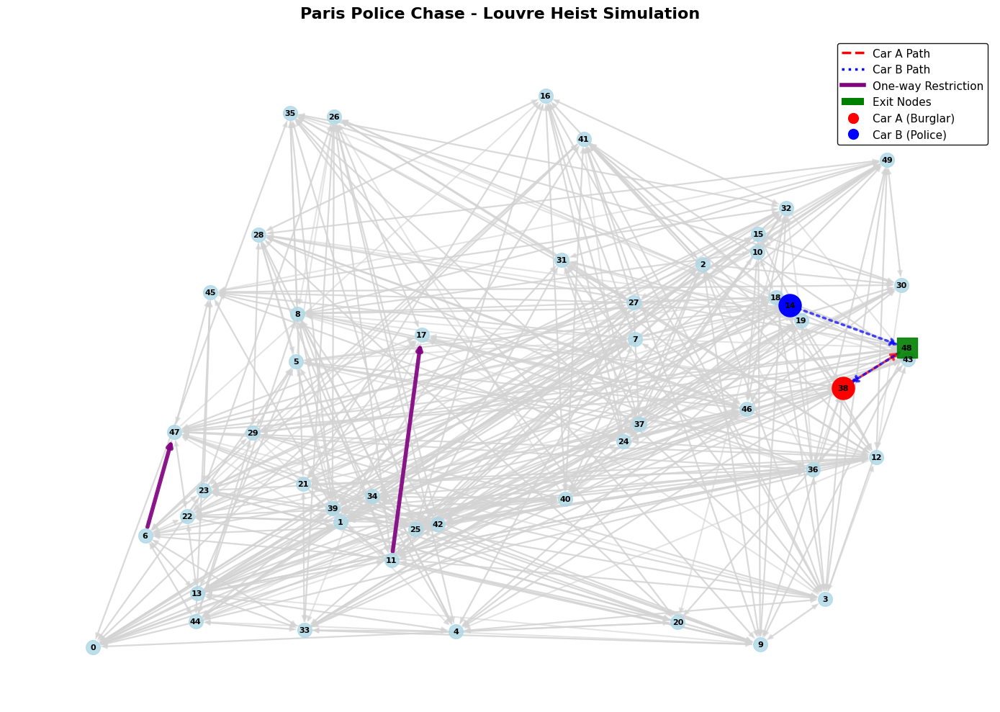


=== Step 13 ===


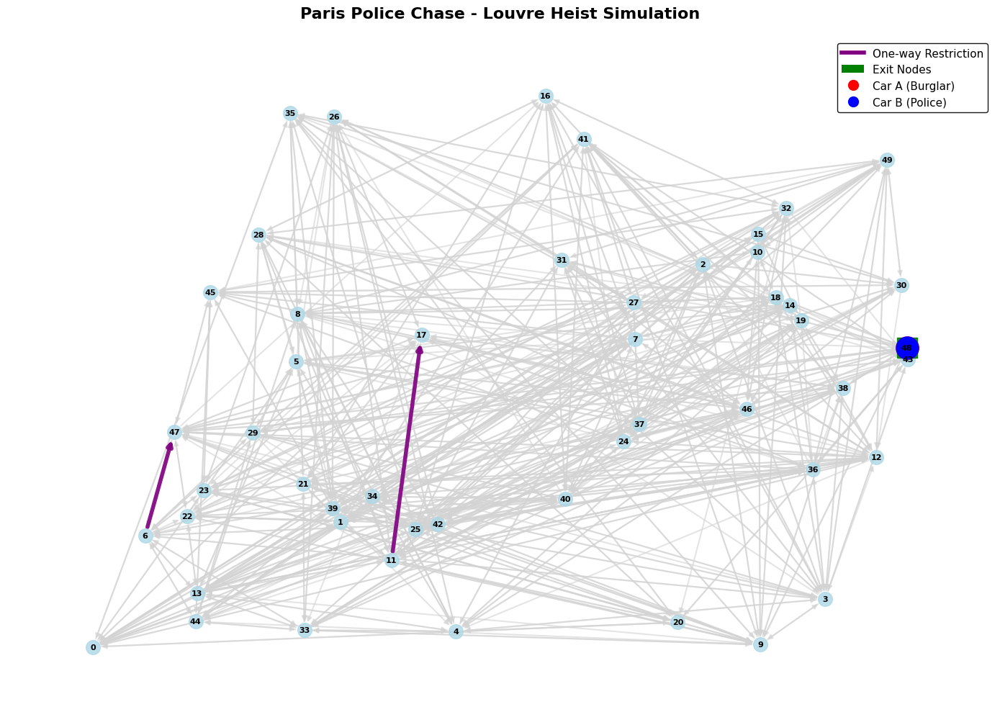

In [30]:
with open("simulation_log.json", "r") as f:
    history = json.load(f)

adjacency, positions, metadata, exit_nodes = loading_graph("graph_with_metadata.json")
visualize_steps(history, adjacency, positions, exit_nodes)